In [ ]:
import os
import gdown
import shutil
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cv2
import random
import tensorflow as tf

from tensorflow.keras.layers import (
    Input, Conv2D, MaxPooling2D, Dropout,
    Conv2DTranspose, concatenate
)
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, f1_score

from tensorflow.keras.layers import (
    Activation, BatchNormalization, Conv2D, Conv2DTranspose,
    Dropout, Input, MaxPooling2D, concatenate
)

import json
from tensorflow.keras.callbacks import ModelCheckpoint


In [ ]:
source = "/content/drive/MyDrive/satalite data/data"

destination = "/content/SatelliteDataset"

shutil.copytree(source, destination)



'/content/SatelliteDataset'

In [ ]:
with rasterio.open("/content/SatelliteDataset/images/0.tif") as src:
    print("Bands:", src.count)
    print("Shape:", src.height, src.width)
    print("Data type:", src.dtypes)

Bands: 12
Shape: 128 128
Data type: ('int16', 'int16', 'int16', 'int16', 'int16', 'int16', 'int16', 'int16', 'int16', 'int16', 'int16', 'int16')


/usr/local/lib/python3.12/dist-packages/rasterio/__init__.py:367: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


In [ ]:


def preview_satellite_image_grid(image_path):

    with rasterio.open(image_path) as src:
        image = src.read()  # shape: (12, H, W)

    band_names = [
        "Coastal", "Blue", "Green", "Red",
        "NIR", "SWIR1", "SWIR2",
        "QA Band", "Merit DEM", "Copernicus DEM",
        "ESA World Cover", "Water Occurrence Probability"
    ]

    # Prepare figure
    fig, axes = plt.subplots(2, 5, figsize=(25, 10))
    axes = axes.flatten()

    # RGB composite in first subplot
    rgb = image[[3,2,1]].astype(np.float32)
    for c in range(3):
        band = rgb[c]
        rgb[c] = (band - band.min()) / (band.max() - band.min())
    rgb = np.transpose(rgb, (1,2,0))

    axes[0].imshow(rgb)
    axes[0].set_title("RGB Composite")
    axes[0].axis("off")

    # Indices to show: 0, 4, 5, 6, 7, 8, 9, 10, 11
    channel_indices = [0, 4, 5, 6, 7, 8, 9, 10, 11]

    for ax_idx, i in enumerate(channel_indices, start=1):
        band = image[i].astype(np.float32)
        name = band_names[i]

        # Choose colormap and normalization
        if i <= 6:  # spectral bands
            band = (band - band.min()) / (band.max() - band.min())
            cmap = "Blues"
        elif i in [8,9]:  # DEMs
            band = (band - band.min()) / (band.max() - band.min())
            cmap = "Blues"
        elif i == 11:  # water probability
            band = band / 100.0
            cmap = "Blues"
        else:  # QA / World Cover
            cmap = "Blues"

        axes[ax_idx].imshow(band, cmap=cmap)
        axes[ax_idx].set_title(name)
        axes[ax_idx].axis("off")

    plt.tight_layout()
    plt.show()


Image : 0.tif


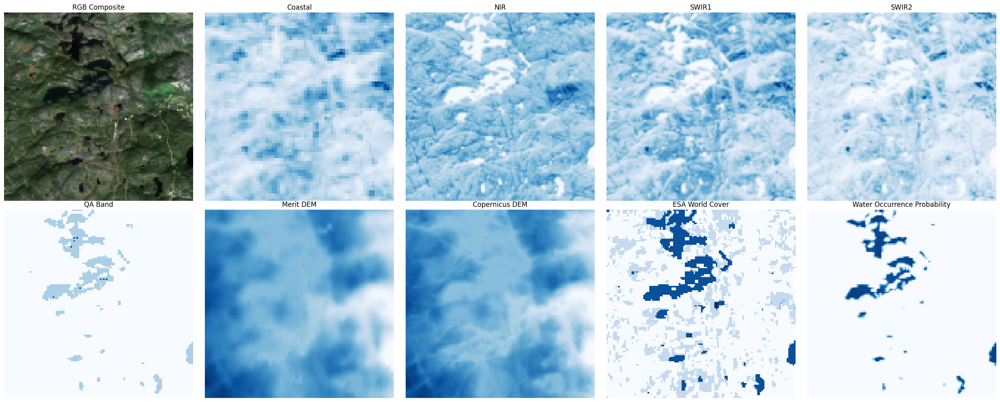



Image : 1.tif


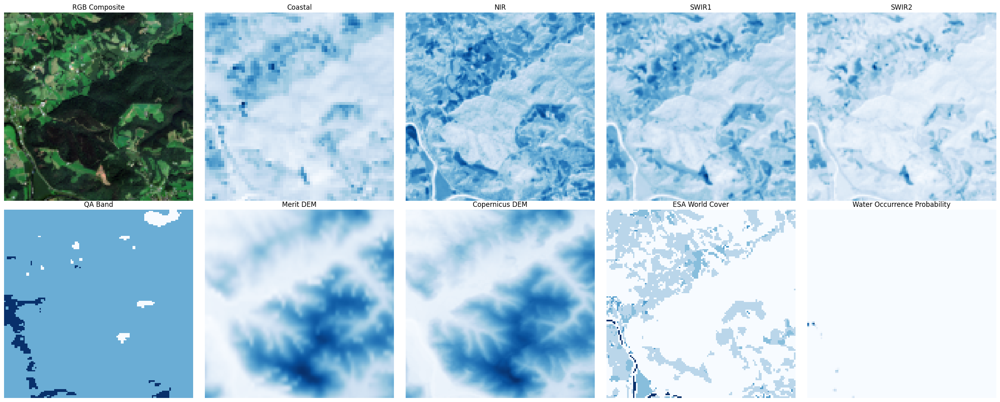



Image : 10.tif


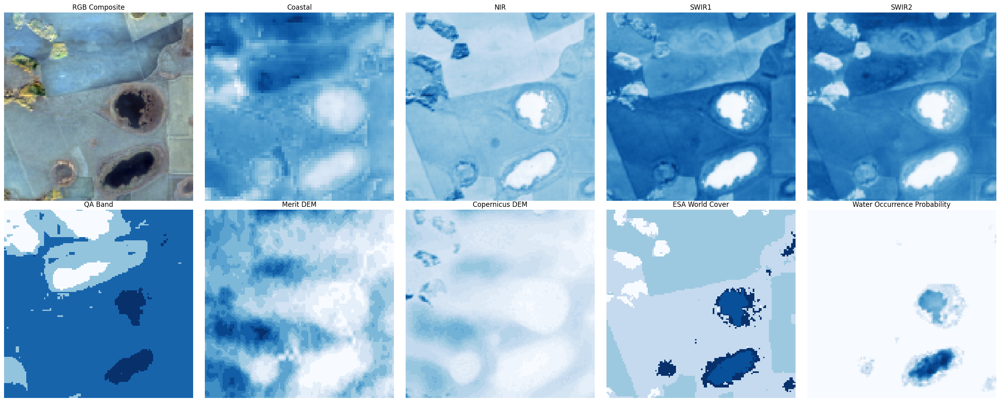



Image : 100.tif


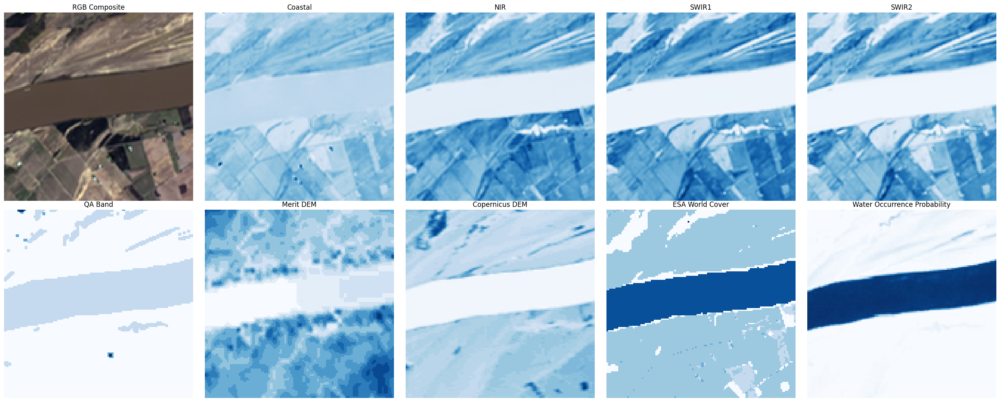



Image : 101.tif


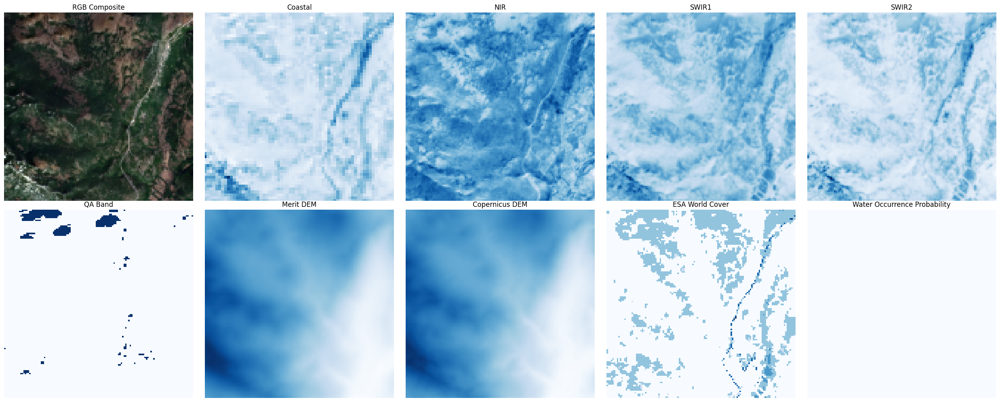



Image : 102.tif


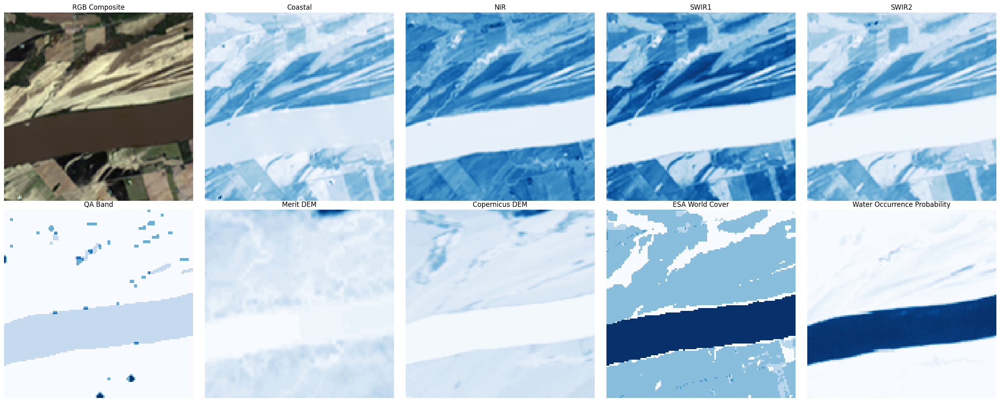



Image : 103.tif


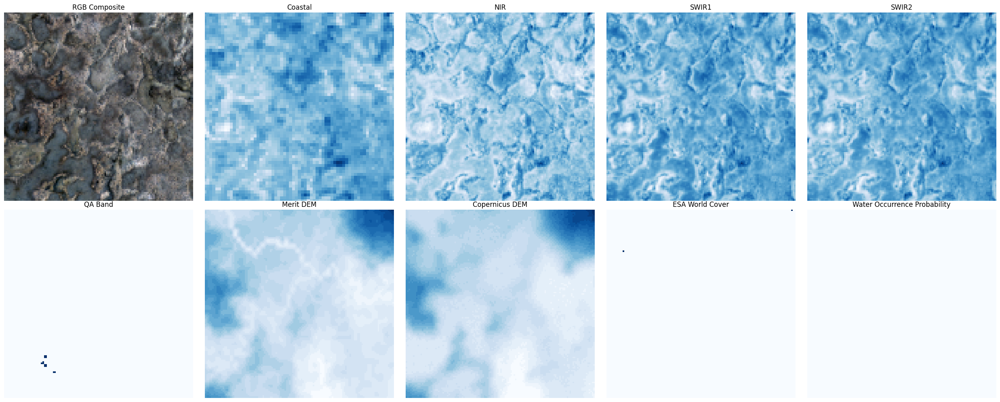



Image : 104.tif


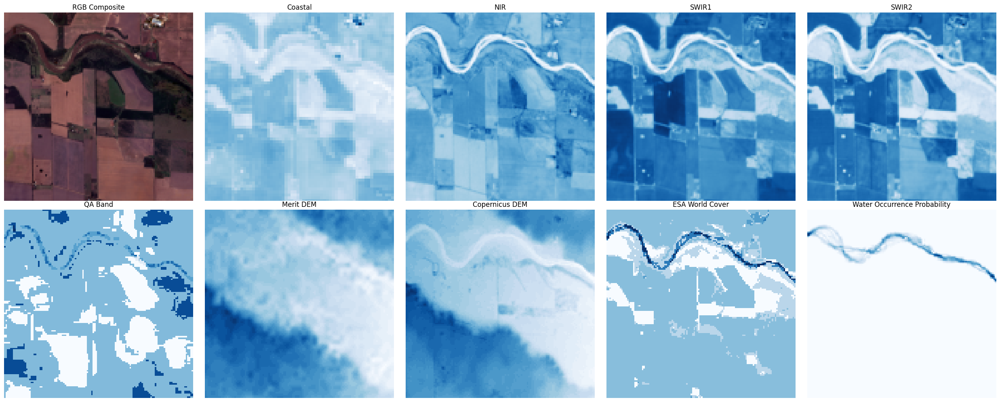



Image : 105.tif


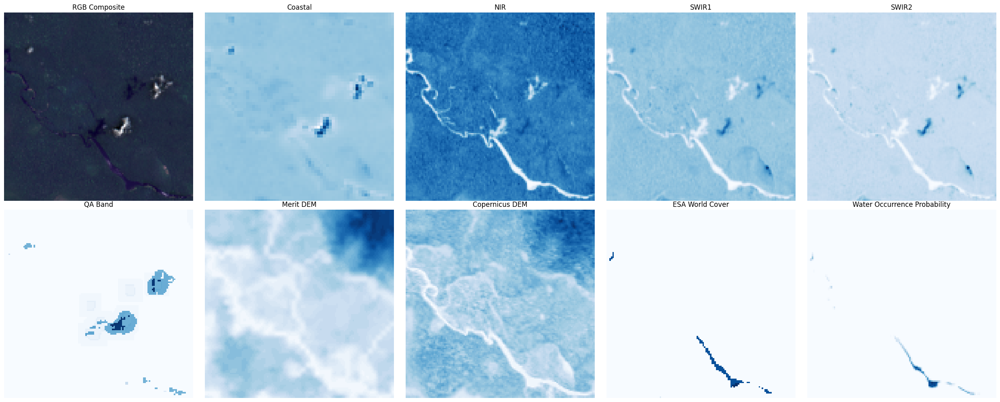



Image : 106.tif


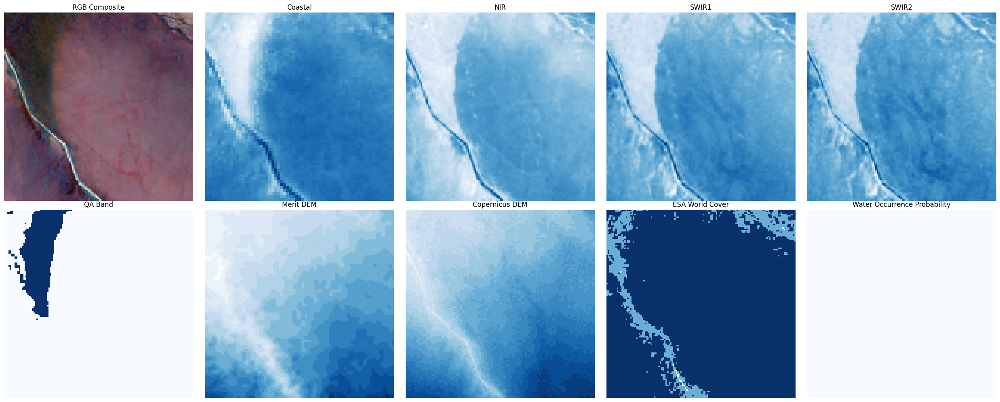



Image : 107.tif


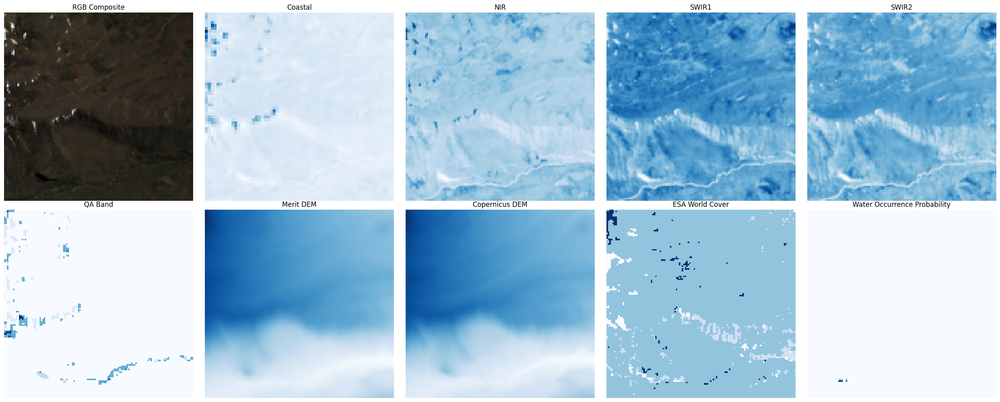



Image : 108.tif


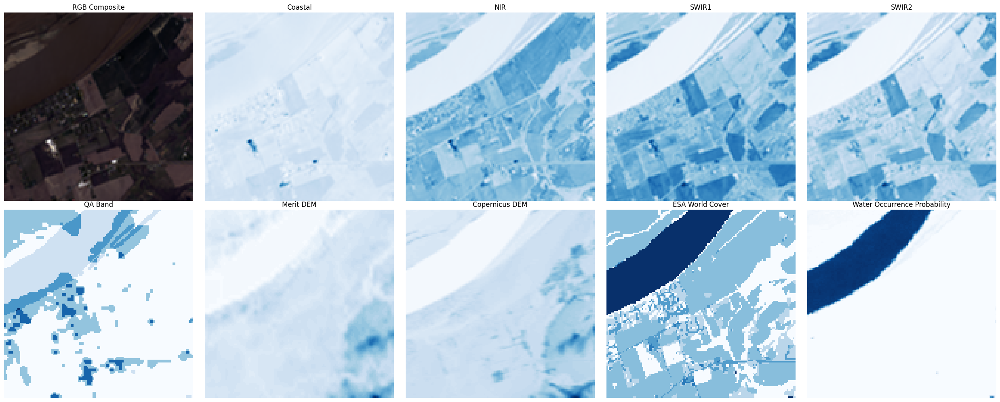



Image : 109.tif


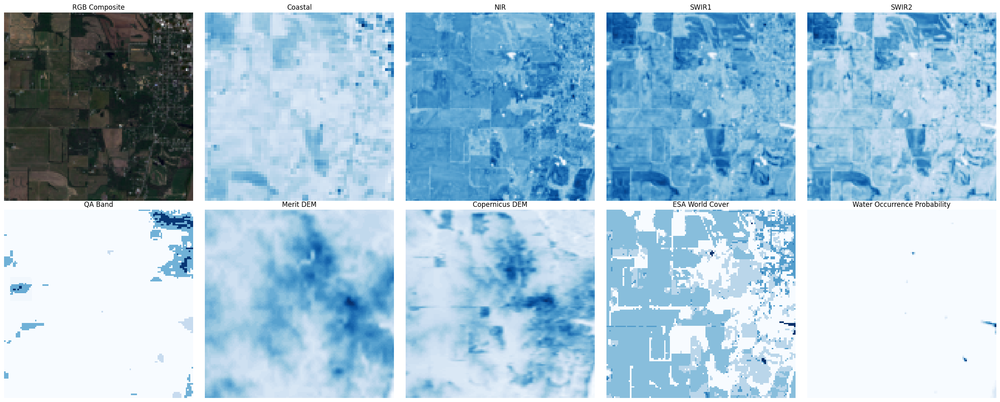



Image : 11.tif


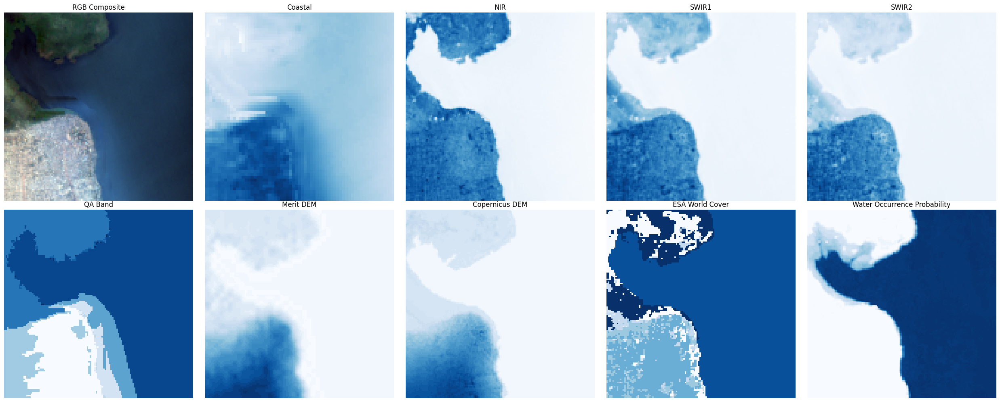



Image : 110.tif


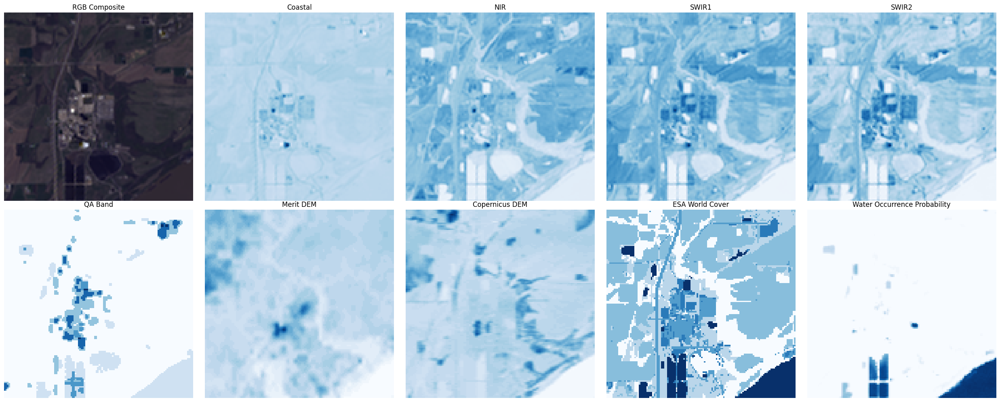



Image : 111.tif


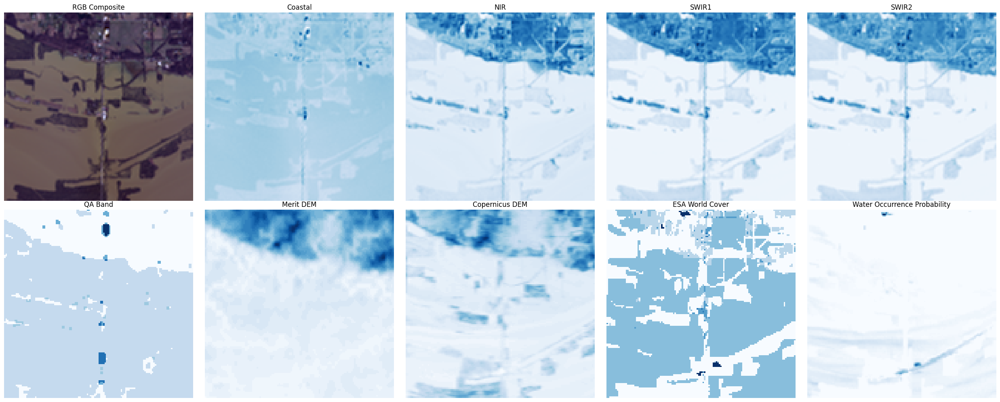



Image : 112.tif


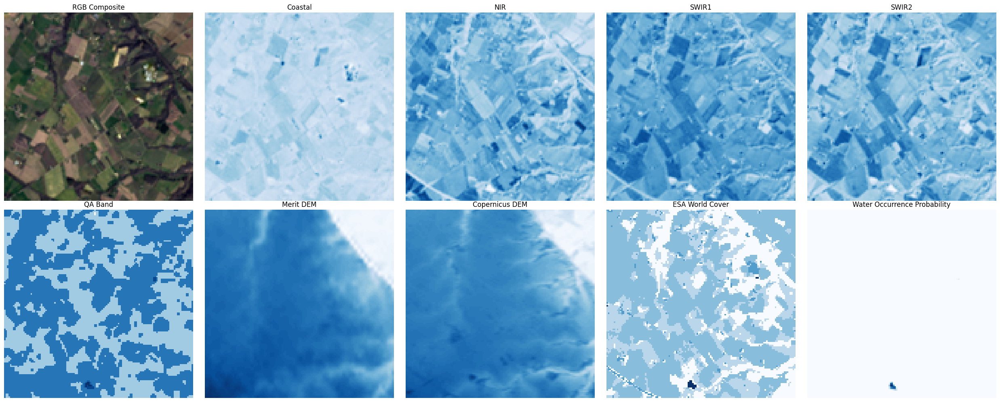



Image : 113.tif


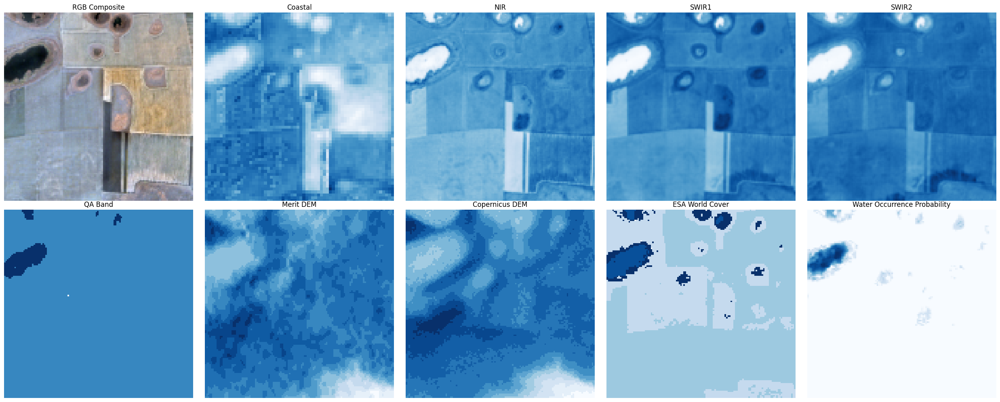



Image : 114.tif


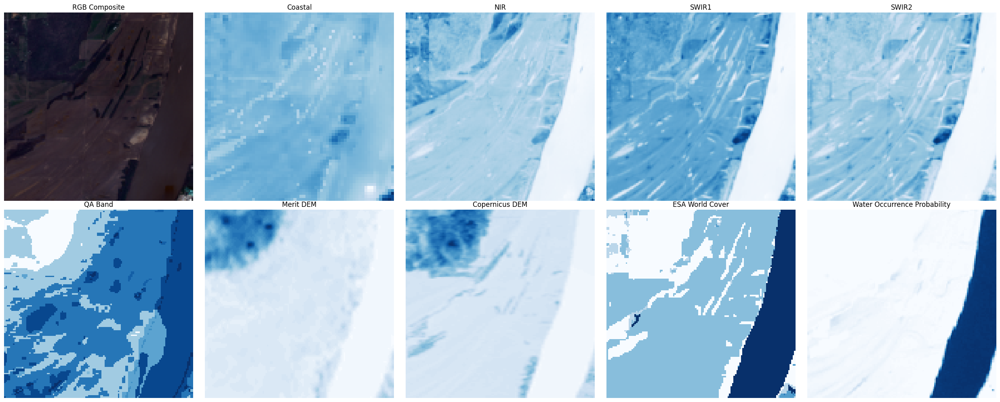



Image : 115.tif


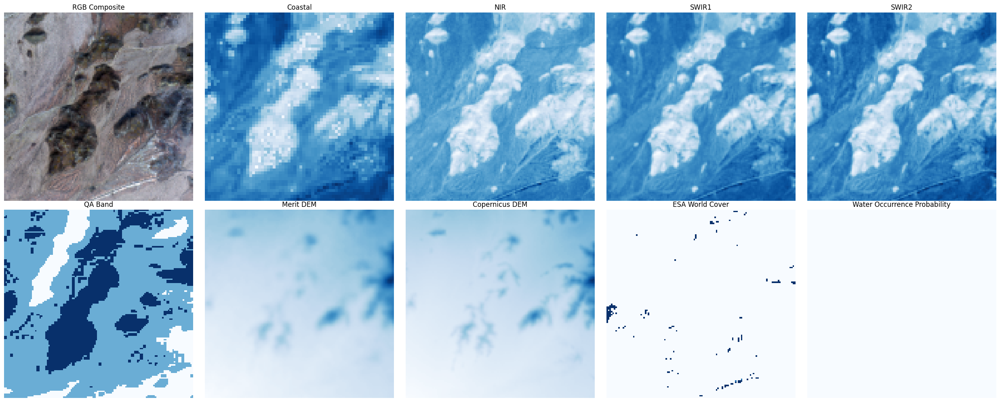

In [ ]:
folder = "/content/SatelliteDataset/images"
files = sorted([f for f in os.listdir(folder) if f.endswith(".tif")])

# Preview first 3 images
for f in files[:20]:
  print(f"Image : {f}")
  preview_satellite_image_grid(os.path.join(folder, f))
  print("\n")


In [ ]:
input_data = sorted(os.listdir("/content/SatelliteDataset/images"))
labels_data = sorted(os.listdir("/content/SatelliteDataset/labels"))

filtered_labels = []

for i in os.listdir("/content/SatelliteDataset/labels"):
  if not("_" in i):
    filtered_labels.append(i)


filtered_labels = sorted(filtered_labels)

print(f"TIF Count : {len(input_data)} ---- Masks Count : {len(filtered_labels)}")

for i in range(10):

  print(f"Trainging : {input_data[i]} ---- Label : {filtered_labels[i]}")


TIF Count : 306 ---- Masks Count : 306
Trainging : 0.tif ---- Label : 0.png
Trainging : 1.tif ---- Label : 1.png
Trainging : 10.tif ---- Label : 10.png
Trainging : 100.tif ---- Label : 100.png
Trainging : 101.tif ---- Label : 101.png
Trainging : 102.tif ---- Label : 102.png
Trainging : 103.tif ---- Label : 103.png
Trainging : 104.tif ---- Label : 104.png
Trainging : 105.tif ---- Label : 105.png
Trainging : 106.tif ---- Label : 106.png


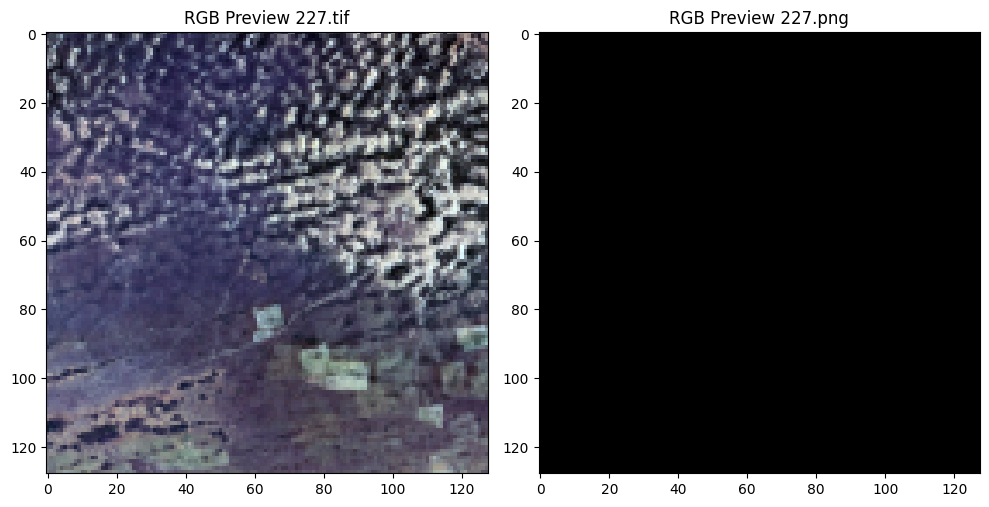

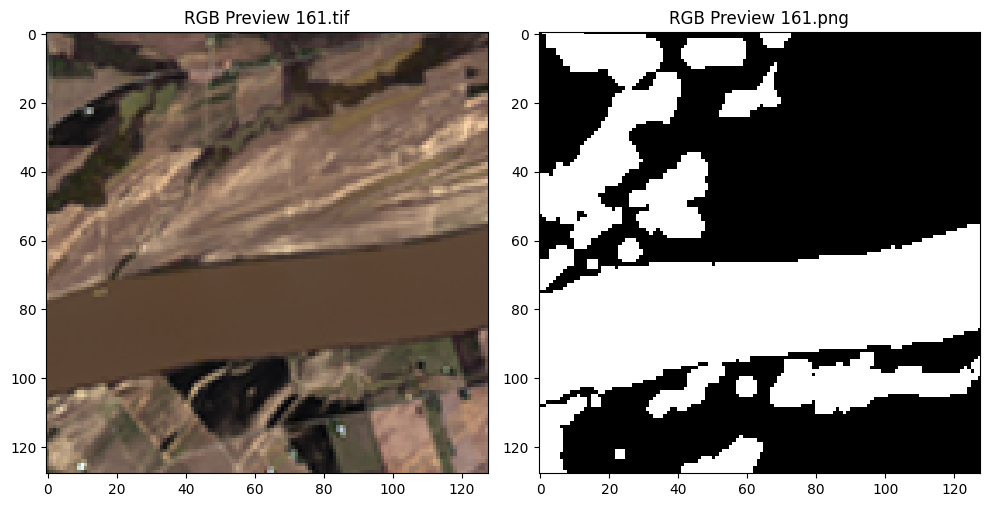

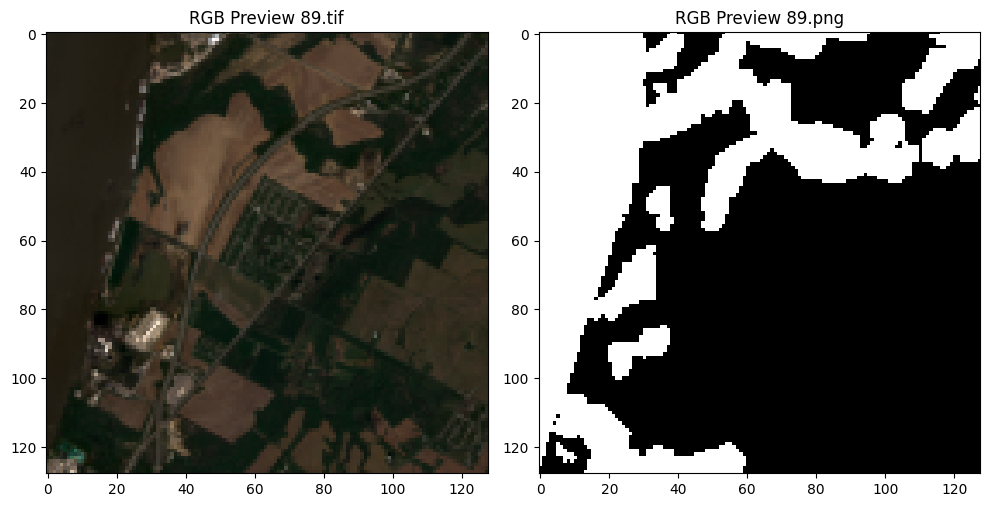

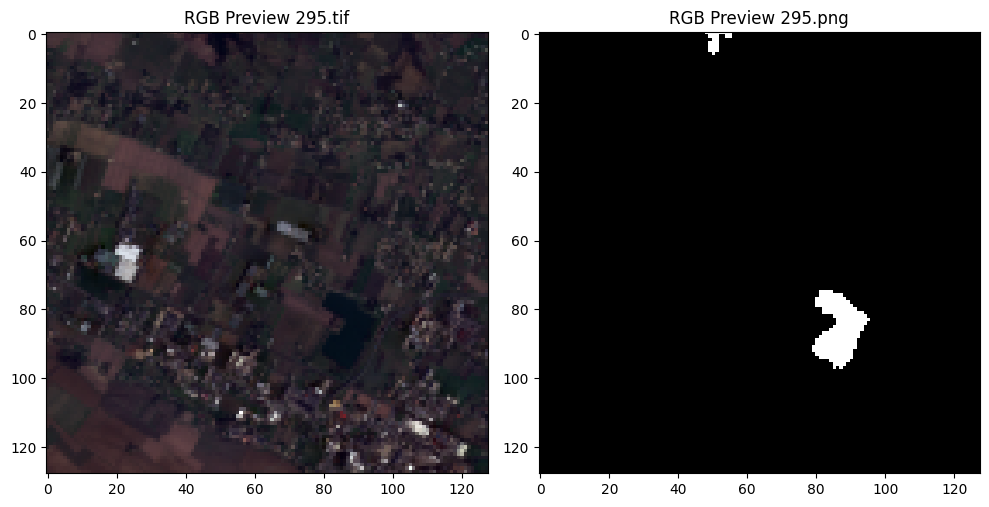

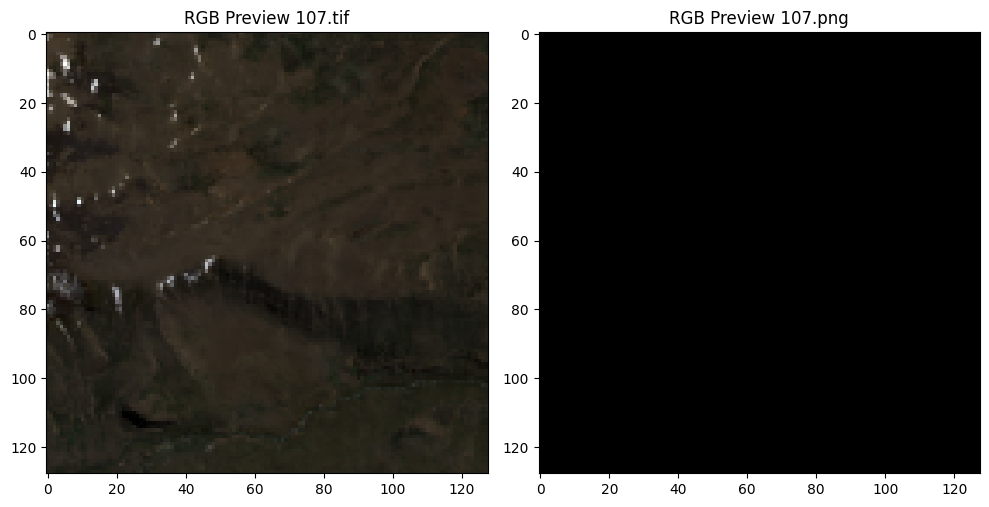

...

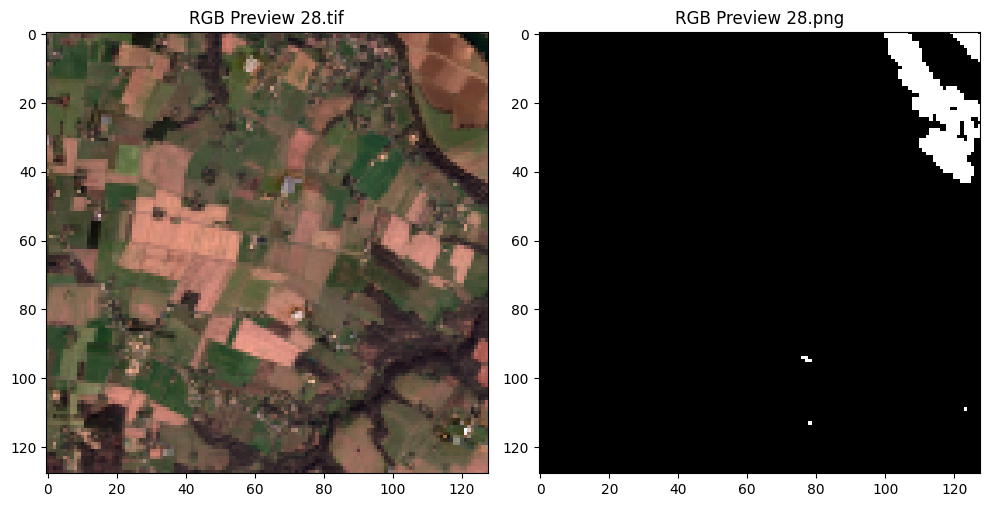

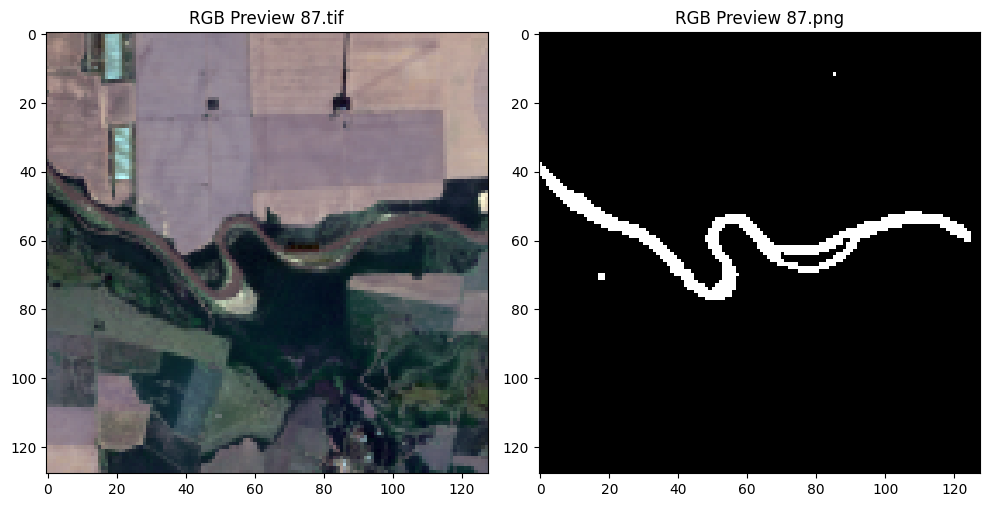

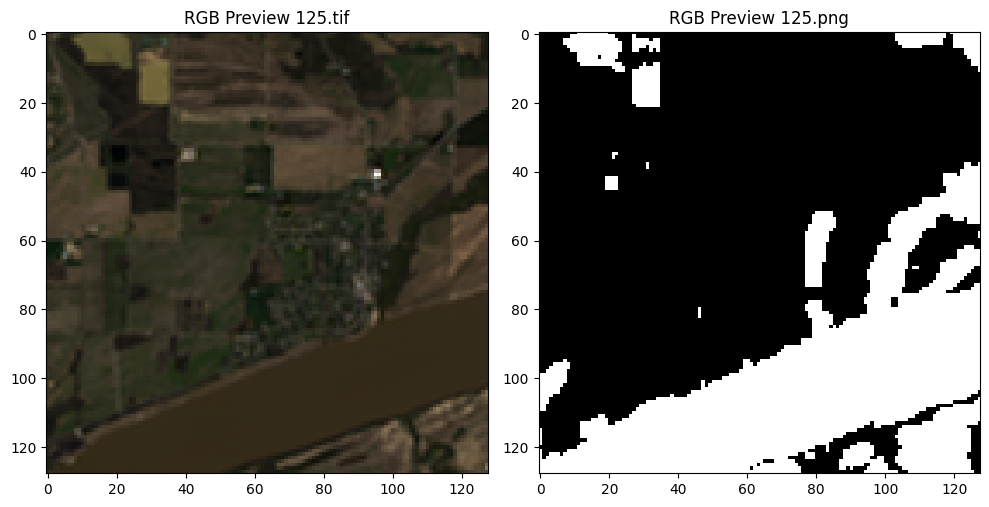

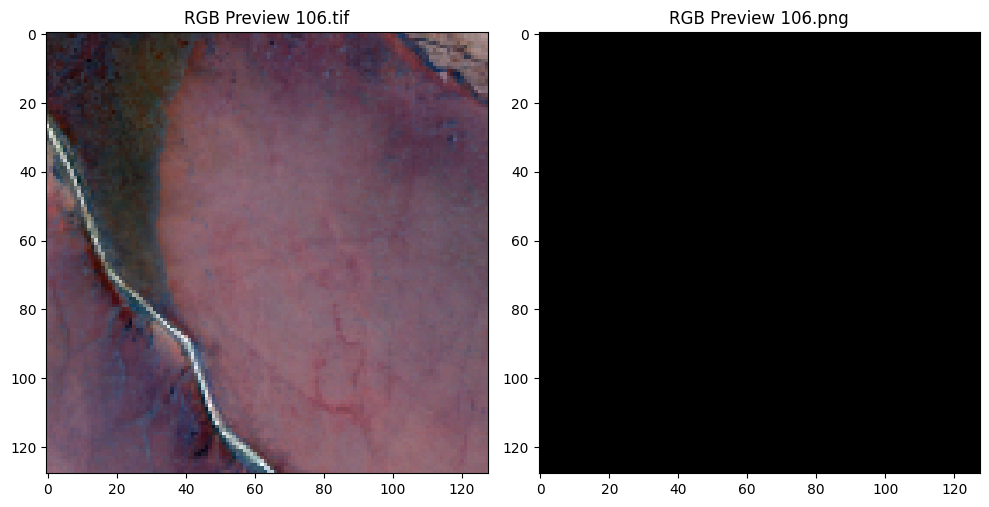

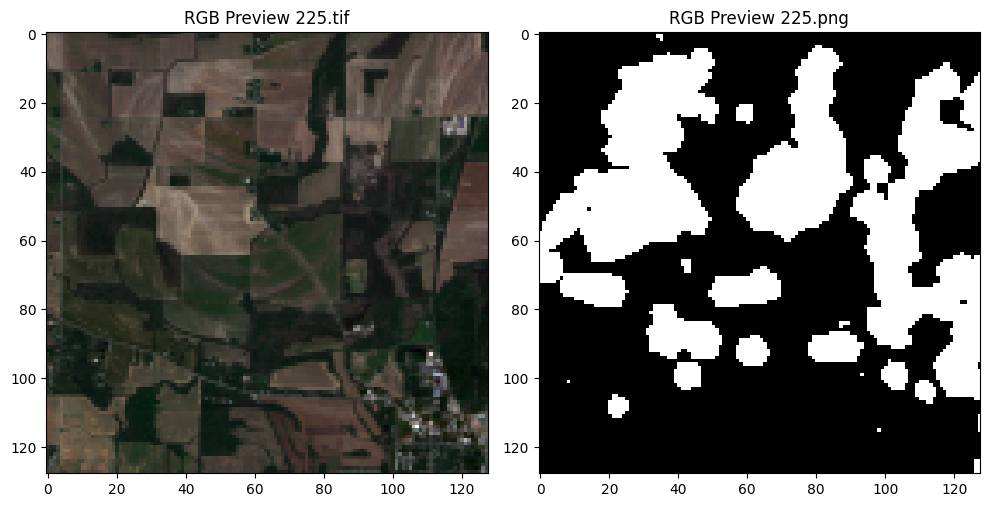

In [ ]:
num_samples = 20


total_available = min(len(filtered_labels), len(input_data))
indices = random.sample(range(total_available), min(num_samples, total_available))


for i in indices:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    input_tif = input_data[i]
    input_png = filtered_labels[i]

    path_input = os.path.join("/content/SatelliteDataset/images" , input_tif)
    with rasterio.open(path_input) as src:
        image = src.read()

    # Normalize only RGB bands
    rgb = image[[3,2,1]].astype(np.float32)
    for c in range(3):
        band = rgb[c]
        rgb[c] = (band - band.min()) / (band.max() - band.min())
    rgb = np.transpose(rgb, (1, 2, 0))

    axes[0].imshow(rgb)
    axes[0].set_title(f"RGB Preview {input_tif}")

    path_png = os.path.join("/content/SatelliteDataset/labels" , input_png)

    # To view binary masks correctly, use gray colormap
    img = cv2.imread(path_png)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img * 255

    axes[1].imshow(img)
    axes[1].set_title(f"RGB Preview {input_png}")

    plt.tight_layout()
    plt.show()

In [ ]:
IMAGE_DIR = "/content/SatelliteDataset/images"
LABEL_DIR = "/content/SatelliteDataset/labels"

SELECTED_CHANNELS = [1, 2, 3, 4, 5, 6,11]  # Blue, Green, Red, NIR, SWIR1, SWIR2 , water

def compute_global_min_max(file_list):
    """
    Compute global min and max for each channel across all images.
    Memory-efficient: loads one image at a time.
    """
    C = len(SELECTED_CHANNELS)
    global_mins = np.full(C, np.inf, dtype=np.float32)
    global_maxs = np.full(C, -np.inf, dtype=np.float32)

    for tif_name in file_list:
        tif_path = os.path.join(IMAGE_DIR, tif_name)
        with rasterio.open(tif_path) as src:
            img = src.read()[SELECTED_CHANNELS, :, :].astype(np.float32)

        # update per-channel min/max
        global_mins = np.minimum(global_mins, img.reshape(C, -1).min(axis=1))
        global_maxs = np.maximum(global_maxs, img.reshape(C, -1).max(axis=1))

    return global_mins, global_maxs


def load_dataset(input_data, filtered_labels):
    """
    Loads images and masks, normalizes each channel across all images,
    computes NDWI and appends it as an extra channel.
    """
    # ---- Compute global min/max first ----
    global_mins, global_maxs = compute_global_min_max(input_data)

    images = []
    masks = []

    for i in range(len(input_data)):
        tif_path = os.path.join(IMAGE_DIR, input_data[i])
        mask_path = os.path.join(LABEL_DIR, filtered_labels[i])

        # ---- Load image ----
        with rasterio.open(tif_path) as src:
            img = src.read()[SELECTED_CHANNELS, :, :].astype(np.float32)  # (C, H, W)

        # ---- Normalize using global min/max ----
        for c in range(len(SELECTED_CHANNELS)):
            min_val = global_mins[c]
            max_val = global_maxs[c]
            if max_val > min_val:
                img[c] = (img[c] - min_val) / (max_val - min_val)
            else:
                img[c] = 0

        # ---- Convert to (H, W, C) ----
        img = np.transpose(img, (1, 2, 0))  # (H, W, C)

        # ---- Load mask ----
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE).astype(np.float32)
        mask = np.expand_dims(mask, axis=-1)  # (H, W, 1)

        images.append(img)
        masks.append(mask)

    images = np.array(images, dtype=np.float32)
    masks = np.array(masks, dtype=np.float32)

    return images, masks

def visualize_predictions(model, X, y, num_samples=3):

    preds = model.predict(X[:num_samples])
    preds = (preds > 0.5).astype(np.float32)

    for i in range(num_samples):

        # Reconstruct RGB from input
        rgb = X[i][:,:,:3]  # Blue, Green, Red
        rgb = rgb[..., ::-1]  # convert BGR → RGB for display
        plt.figure(figsize=(15,5))

        # Input RGB
        plt.subplot(1,3,1)
        plt.imshow(rgb)
        plt.title("Input RGB")
        plt.axis("off")

        # Ground Truth
        plt.subplot(1,3,2)
        plt.imshow(y[i].squeeze(), cmap='Blues')
        plt.title("Ground Truth")
        plt.axis("off")

        # Prediction
        plt.subplot(1,3,3)
        plt.imshow(preds[i].squeeze(), cmap='Blues')
        plt.title("Prediction")
        plt.axis("off")

        plt.show()



In [ ]:
X2, y2 = load_dataset(input_data, filtered_labels)

print("Images shape:", X2.shape)
print("Masks shape:", y2.shape)
X_train, X_val, y_train, y_val = train_test_split(
    X2, y2, test_size=0.2, random_state=42
)

/usr/local/lib/python3.12/dist-packages/rasterio/__init__.py:367: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


Images shape: (306, 128, 128, 7)
Masks shape: (306, 128, 128, 1)


In [ ]:
global_mins, global_maxs = compute_global_min_max(input_data)

preprocessing = {
    "selected_channels": SELECTED_CHANNELS,  # [1,2,3,4,5,6]
    "global_mins": global_mins.tolist(),
    "global_maxs": global_maxs.tolist(),
}

with open("preprocessing.json", "w") as f:
    json.dump(preprocessing, f)

In [ ]:
def multi_channel_fusion_head(inputs):
    rgb  = inputs[..., :3]
    nir  = inputs[..., 3:4]
    swir = inputs[..., 4:6]
    waterp = inputs[..., 6:7]



    rgb_feat  = Conv2D(32, 3, padding='same', activation='relu')(rgb)
    nir_feat  = Conv2D(16, 3, padding='same', activation='relu')(nir)
    swir_feat = Conv2D(16, 3, padding='same', activation='relu')(swir)
    waterp_feat = Conv2D(8,  3, padding='same', activation='relu')(waterp)
    fused = concatenate([rgb_feat, nir_feat, swir_feat,waterp_feat], axis=-1)

    fused = Conv2D(64, 1, padding='same', activation='relu')(fused)
    fused = BatchNormalization()(fused)

    return fused

def conv_block2(x, filters):
    x = Conv2D(filters, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    return x


def build_unet_fusion(input_shape=(128, 128, 7)):

    inputs = Input(input_shape)

    x = multi_channel_fusion_head(inputs)

    # -------- Encoder --------
    c1 = conv_block2(x, 32)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = conv_block2(p1, 64)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = conv_block2(p2, 128)
    p3 = MaxPooling2D((2, 2))(c3)

    # -------- Bottleneck --------
    c4 = conv_block2(p3, 256)
    c4 = Dropout(0.3)(c4)

    # -------- Decoder --------
    u5 = Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(c4)
    u5 = concatenate([u5, c3])
    c5 = conv_block2(u5, 128)

    u6 = Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c2])
    c6 = conv_block2(u6, 64)

    u7 = Conv2DTranspose(32, 2, strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c1])
    c7 = conv_block2(u7, 32)

    outputs = Conv2D(1, 1, activation='sigmoid')(c7)

    model = Model(inputs, outputs)

    return model


In [ ]:
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (
        K.sum(y_true_f) + K.sum(y_pred_f) + smooth
    )


def iou_metric(y_true, y_pred, smooth=1e-6):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    total = K.sum(y_true_f) + K.sum(y_pred_f)
    union = total - intersection
    return (intersection + smooth) / (union + smooth)


def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)


def bce_dice_loss(y_true, y_pred):
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    return bce + dice_loss(y_true, y_pred)


In [ ]:
model5 = build_unet_fusion(input_shape=(128, 128, 7))

model5.compile(
    optimizer='adam',
    loss=bce_dice_loss,
    metrics=[dice_coefficient, iou_metric]
)

history10= model5.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=200,
    batch_size=8
)

Epoch 1/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 41s 651ms/step - dice_coefficient: 0.5377 - iou_metric: 0.3780 - loss: 0.9798 - val_dice_coefficient: 0.3470 - val_iou_metric: 0.2138 - val_loss: 1.1871
Epoch 2/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - dice_coefficient: 0.6266 - iou_metric: 0.4718 - loss: 0.7099 - val_dice_coefficient: 0.3426 - val_iou_metric: 0.2103 - val_loss: 1.1334
Epoch 3/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - dice_coefficient: 0.6441 - iou_metric: 0.4838 - loss: 0.6458 - val_dice_coefficient: 0.2846 - val_iou_metric: 0.1676 - val_loss: 1.2000
Epoch 4/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - dice_coefficient: 0.6786 - iou_metric: 0.5283 - loss: 0.6061 - val_dice_coefficient: 0.1926 - val_iou_metric: 0.1071 - val_loss: 1.3361
Epoch 5/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - dice_coefficient: 0.6996 - iou_metric: 0.5491 - loss: 0.5670 - val_dice_coefficient: 0.3039 - val_iou_metric: 0.1831 - val_loss: 1.1535
Epoch 6/200
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/s

In [ ]:
checkpoint = ModelCheckpoint(
    "fusion2_unet_best.h5",   # file path
    monitor="iou_metric",       # or "val_dice_coefficient"
    save_best_only=True,      # only save when validation improves
    save_weights_only=False,  # save full model (architecture + weights)
    mode="min"                # "min" for loss, "max" for metrics
)

model5.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=50,
    batch_size=8,
    callbacks=[checkpoint]
)

Epoch 1/50
30/31 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - dice_coefficient: 0.9698 - iou_metric: 0.9417 - loss: 0.0626

31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - dice_coefficient: 0.9695 - iou_metric: 0.9414 - loss: 0.0626 - val_dice_coefficient: 0.9154 - val_iou_metric: 0.8505 - val_loss: 0.2294
Epoch 2/50
30/31 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - dice_coefficient: 0.9226 - iou_metric: 0.8687 - loss: 0.1340

31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - dice_coefficient: 0.9241 - iou_metric: 0.8709 - loss: 0.1323 - val_dice_coefficient: 0.9053 - val_iou_metric: 0.8324 - val_loss: 0.2354
Epoch 3/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - dice_coefficient: 0.9517 - iou_metric: 0.9104 - loss: 0.0930 - val_dice_coefficient: 0.9179 - val_iou_metric: 0.8521 - val_loss: 0.2094
Epoch 4/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - dice_coefficient: 0.9692 - iou_metric: 0.9404 - loss: 0.0625 - val_dice_coefficient: 0.9187 - val_iou_metric: 0.8544 - val_loss: 0.2095
Epoch 5/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - dice_coefficient: 0.9731 - iou_metric: 0.9480 - loss: 0.0547 - val_dice_coefficient: 0.9184 - val_iou_metric: 0.8545 - val_loss: 0.2064
Epoch 6/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - dice_coefficient: 0.9689 - iou_metric: 0.9403 - loss: 0.0599 - val_dice_coefficient: 0.9225 - val_iou_metric: 0.8601 - val_loss: 0.2059
Epoch 7/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - dice_coeffici

In [ ]:
model5.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=50,
    batch_size=8,
    callbacks=[checkpoint]
)

Epoch 1/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - dice_coefficient: 0.9808 - iou_metric: 0.9623 - loss: 0.0408 - val_dice_coefficient: 0.9343 - val_iou_metric: 0.8811 - val_loss: 0.2145
Epoch 2/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - dice_coefficient: 0.9805 - iou_metric: 0.9619 - loss: 0.0380 - val_dice_coefficient: 0.9349 - val_iou_metric: 0.8817 - val_loss: 0.2103
Epoch 3/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - dice_coefficient: 0.9821 - iou_metric: 0.9649 - loss: 0.0368 - val_dice_coefficient: 0.9392 - val_iou_metric: 0.8890 - val_loss: 0.1976
Epoch 4/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - dice_coefficient: 0.9796 - iou_metric: 0.9604 - loss: 0.0371 - val_dice_coefficient: 0.9386 - val_iou_metric: 0.8872 - val_loss: 0.1867
Epoch 5/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - dice_coefficient: 0.9853 - iou_metric: 0.9711 - loss: 0.0327 - val_dice_coefficient: 0.9339 - val_iou_metric: 0.8803 - val_loss: 0.2014
Epoch 6/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - di

31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - dice_coefficient: 0.9571 - iou_metric: 0.9205 - loss: 0.1006 - val_dice_coefficient: 0.7979 - val_iou_metric: 0.6719 - val_loss: 1.3203
Epoch 31/50
30/31 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - dice_coefficient: 0.8861 - iou_metric: 0.7973 - loss: 0.2930

31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - dice_coefficient: 0.8861 - iou_metric: 0.7972 - loss: 0.2909 - val_dice_coefficient: 0.7537 - val_iou_metric: 0.6213 - val_loss: 0.7018
Epoch 32/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - dice_coefficient: 0.9100 - iou_metric: 0.8388 - loss: 0.1725 - val_dice_coefficient: 0.8618 - val_iou_metric: 0.7663 - val_loss: 0.3230
Epoch 33/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - dice_coefficient: 0.9541 - iou_metric: 0.9127 - loss: 0.0914 - val_dice_coefficient: 0.8606 - val_iou_metric: 0.7679 - val_loss: 0.3057
Epoch 34/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - dice_coefficient: 0.9608 - iou_metric: 0.9249 - loss: 0.0828 - val_dice_coefficient: 0.9072 - val_iou_metric: 0.8367 - val_loss: 0.2127
Epoch 35/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - dice_coefficient: 0.9704 - iou_metric: 0.9426 - loss: 0.0639 - val_dice_coefficient: 0.9049 - val_iou_metric: 0.8355 - val_loss: 0.2256
Epoch 36/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - dice_coe

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


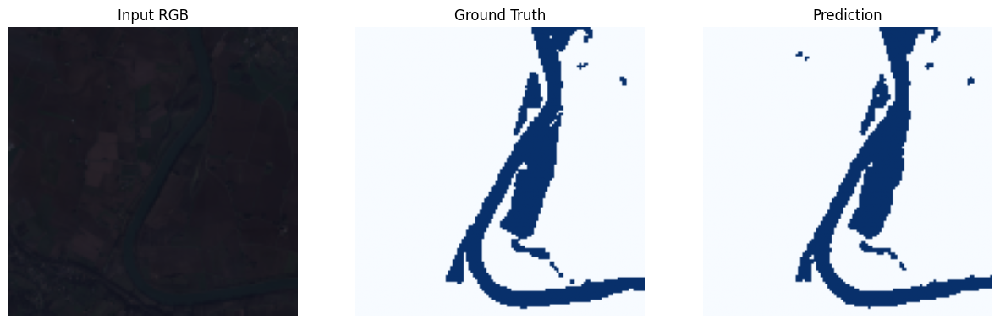

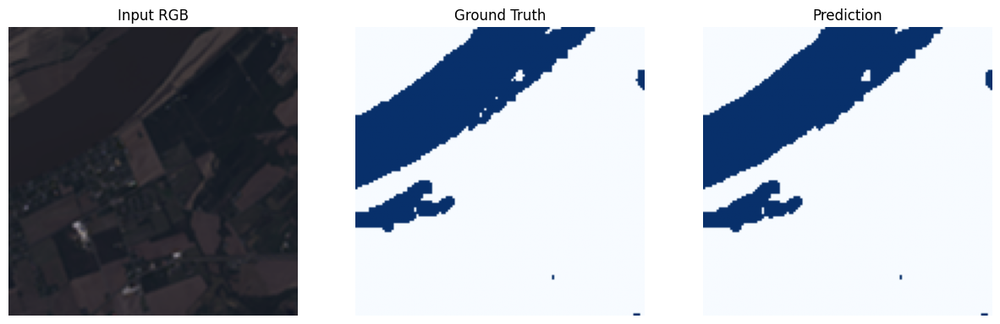

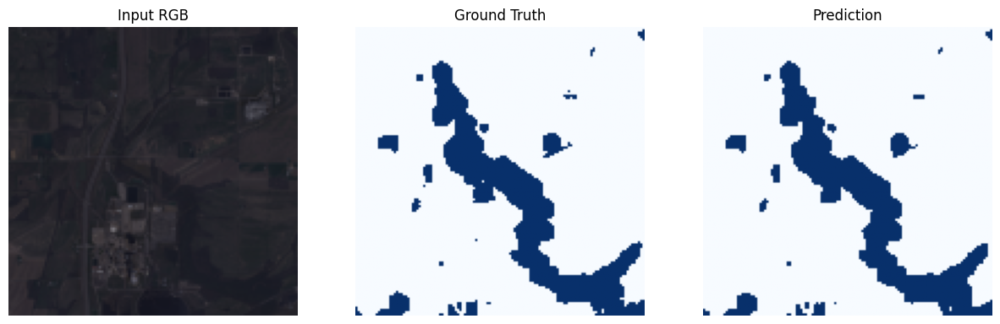

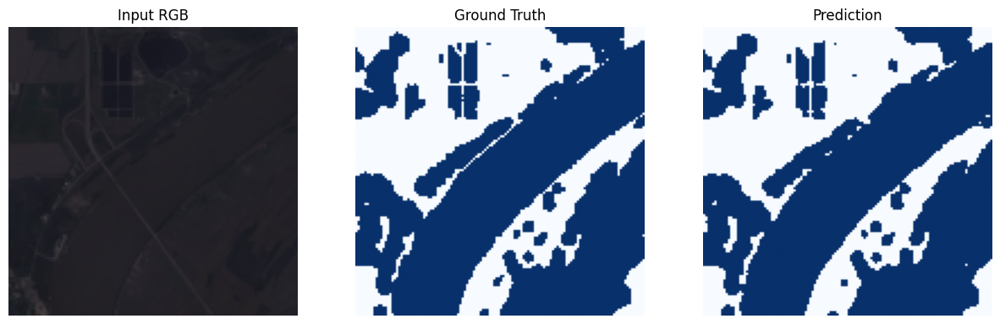

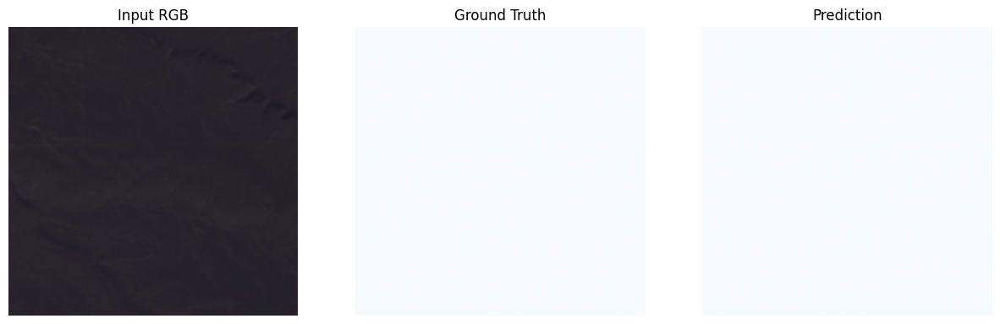

...

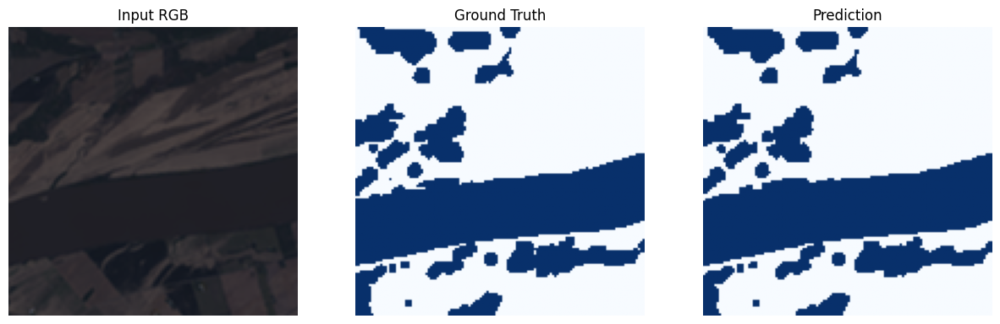

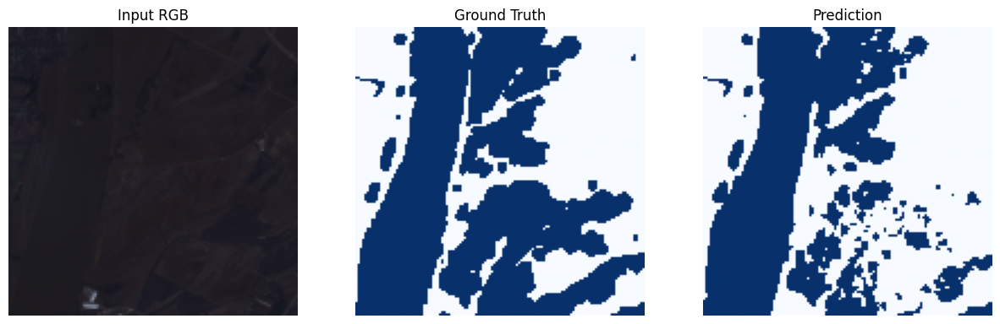

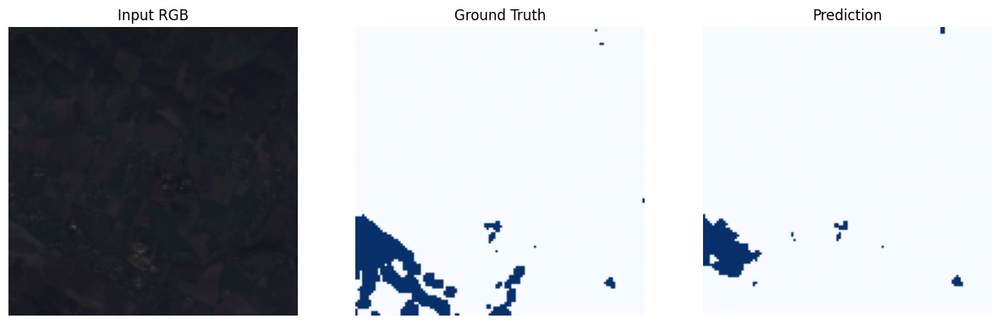

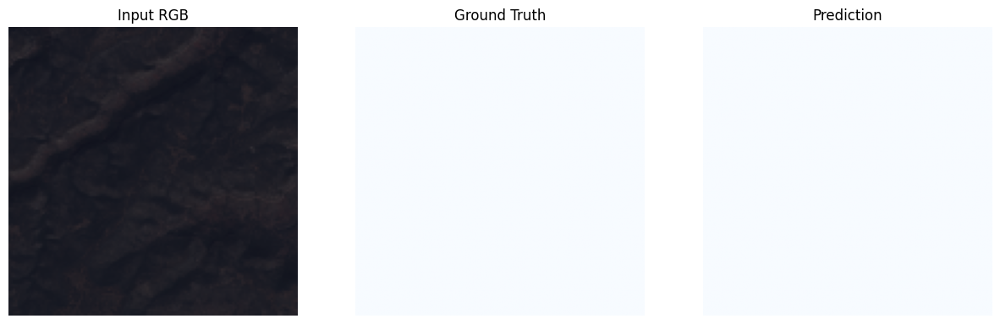

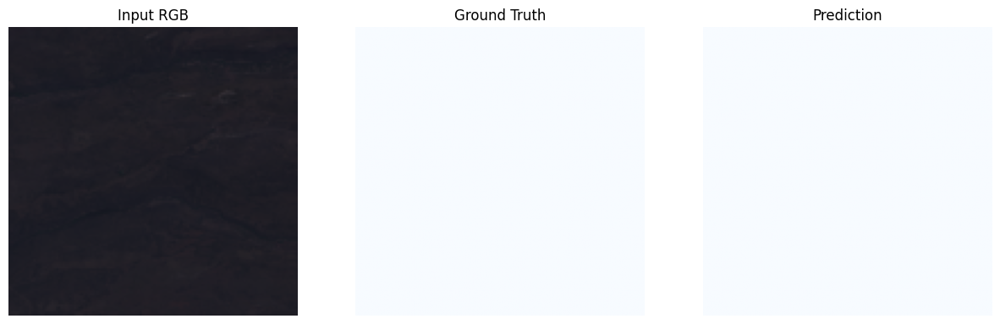

In [ ]:
visualize_predictions(model5, X_val, y_val, num_samples=15)


In [ ]:
# Make predictions on the validation set
y_pred = model5.predict(X_val)
y_pred_binary = (y_pred > 0.5).astype(int)

# Flatten the ground truth and predicted masks for metric calculation
y_true_flat = y_val.flatten()
y_pred_flat = y_pred_binary.flatten()

# Calculate F1-score
f1 = f1_score(y_true_flat, y_pred_flat)
print(f"F1 Score: {f1:.4f}")

# Calculate Classification Report
class_report = classification_report(y_true_flat, y_pred_flat)
print("\nClassification Report:")
print(class_report)

2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 971ms/step
F1 Score: 0.9387

Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98    787894
         1.0       0.97      0.91      0.94    227914

    accuracy                           0.97   1015808
   macro avg       0.97      0.95      0.96   1015808
weighted avg       0.97      0.97      0.97   1015808



In [ ]:
# Save full model
model5.save("fusion3_unet_model.h5")